In [1]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

## Import các thư viện cần thiết và cấu hình

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
from PIL import Image
import warnings
from tqdm import tqdm 
warnings.filterwarnings('ignore')

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('husl')
print("TensorFlow version:", tf.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

2025-12-18 01:37:17.972433: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1766021838.125416      24 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1766021838.170812      24 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1766021838.533795      24 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1766021838.533836      24 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1766021838.533839      24 computation_placer.cc:177] computation placer alr

TensorFlow version: 2.19.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
CONFIG = {
    # KAGGLE PATHS
    'TRAIN_DIR': '/kaggle/input/chicken-disease-1/Train',
    'CSV_PATH': r'/kaggle/input/chicken-disease-1/train_data.csv', 
    # Model params
    'IMG_SIZE': 224,
    'BATCH_SIZE': 32,
    'EPOCHS': 100,
    'VALIDATION_SPLIT': 0.2,
    'SEED': 42,
    'NUM_CLASSES': 4,
    'LEARNING_RATE': 1e-4,
    'VALIDATION_SPLIT': 0.2
}

CLASS_NAMES = ['Coccidiosis', 'Healthy', 'New Castle Disease', 'Salmonella']
NUM_CLASSES = len(CLASS_NAMES)
SEED = CONFIG['SEED'
np.random.seed(SEED)
tf.random.set_seed(SEED)
print("Configuration loaded!")

Configuration loaded!


## Tiền xử lý dữ liệu và Data Augmentation

In [ ]:
df['image_path'] = df['images'].apply(lambda x: os.path.join(CONFIG['TRAIN_DIR'], x))
# Kiem tra xem tat ca anh co ton tai khong
df['exists'] = df['image_path'].apply(os.path.exists)
print(f"So anh ton tai: {df['exists'].sum()}/{len(df)}")
# Chi giu lai nhung anh ton tai
df = df[df['exists'] == True].copy()
print(f"So mau sau khi loc: {len(df)}")

So anh ton tai: 8067/8067
So mau sau khi loc: 8067


Hàm balance_all_classes thực hiện kỹ thuật Random Oversampling bằng cách xác định số lượng mẫu của lớp đa số làm chuẩn, sau đó nhân bản ngẫu nhiên các mẫu của các lớp thiểu số cho đến khi tất cả các lớp có số lượng bằng nhau. Cuối cùng, hàm hợp nhất toàn bộ dữ liệu và xáo trộn ngẫu nhiên thứ tự các dòng, giúp loại bỏ tình trạng mất cân bằng dữ liệu và đảm bảo mô hình huấn luyện công bằng giữa các lớp bệnh, đặc biệt là với các lớp có ít dữ liệu như Newcastle.

Phân chia dữ liệu theo tỷ lệ chuẩn 70% Train, 15% Validation và 15% Test, đồng thời sử dụng tham số stratify để duy trì phân bổ các lớp bệnh đồng nhất giữa các tập, đặc biệt quan trọng đối với lớp thiểu số như Newcastle. Sau đó, kỹ thuật cân bằng lớp chỉ được áp dụng duy nhất lên tập huấn luyện (train_df) nhằm đưa số lượng mẫu của tất cả các bệnh về mức tương đương nhau, giúp mô hình học tập hiệu quả mà vẫn đảm bảo tính khách quan, tránh rò rỉ dữ liệu khi đánh giá trên tập Val và Test.

In [ ]:
# CUSTOM DATA SPLIT: 70% Train, 15% Val, 15% Test
from sklearn.model_selection import train_test_split
import pandas as pd
# Define Oversample Function for all classes
def balance_all_classes(df, target_col='label'):
    max_size = df[target_col].value_counts().max()
    lst = [df]
    for class_index, group in df.groupby(target_col):
        samples_needed = max_size - len(group)
        if samples_needed > 0:
            # Oversample các lớp ít hơn
            lst.append(group.sample(samples_needed, replace=True, random_state=SEED))
    return pd.concat(lst).sample(frac=1, random_state=SEED)
train_df, temp_df = train_test_split(df, test_size=0.3, random_state=SEED, stratify=df['label'])
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=SEED, stratify=temp_df['label'])
print(f"Training Set Size: {len(train_df)} ({len(train_df)/len(df)*100:.2f}%)")
print(f"Validation Set Size: {len(val_df)} ({len(val_df)/len(df)*100:.2f}%)")
print(f"Test Set Size: {len(test_df)} ({len(test_df)/len(df)*100:.2f}%)")
# Oversample ALL minority classes to match the majority class
train_df_balanced = balance_all_classes(train_df)
print(f"Balanced Training Set Size: {len(train_df_balanced)}")
print(train_df_balanced['label'].value_counts())

Training Set Size: 5646 (69.99%)
Validation Set Size: 1210 (15.00%)
Test Set Size: 1211 (15.01%)
Balanced Training Set Size: 7348
label
Healthy               1837
New Castle Disease    1837
Salmonella            1837
Coccidiosis           1837
Name: count, dtype: int64


Tất cả 4 lớp bệnh hiện tại đều có số lượng mẫu bằng nhau tuyệt đối (1,837 mẫu/lớp).

Lớp New Castle Disease từ chỗ chỉ có khoảng 393 mẫu (ở tập Train gốc) đã được nâng lên 1,837 mẫu. Điều này sẽ giúp mô hình có đủ dữ liệu để nhận diện bệnh này tốt tương đương với các bệnh khác, loại bỏ hoàn toàn sự thiên vị do mất cân bằng dữ liệu gây ra.

Chiến lược tăng cường dữ liệu kết hợp linh hoạt các phép xoay, lật và thay đổi độ sáng nhằm thích ứng với đặc điểm phân gà không có hướng cố định và điều kiện ánh sáng chuồng trại thay đổi. Việc bổ sung hàm tùy chỉnh với kỹ thuật làm mờ Gaussian và nhiễu hạt giúp mô hình tăng khả năng chống chịu với các sai số thực tế từ camera như rung tay hay thiếu sáng. Trong khi đó, tập Validation và Test chỉ được chuẩn hóa pixel về khoảng [0, 1] để đảm bảo kết quả đánh giá luôn khách quan và phản ánh đúng hiệu năng thực tế của mô hình.

In [ ]:

def custom_augmentation(img):
    #  Gaussian Blur (30%)
    if np.random.random() < 0.3:
        img = cv2.GaussianBlur(img, (3, 3), 0)
    #  Random Noise (30%)
    if np.random.random() < 0.3:
        noise = np.random.normal(0, 5, img.shape)
        img = np.clip(img + noise, 0, 255)
    return img.astype(np.float32)
train_datagen = ImageDataGenerator(
    rescale=1./255,      # Chuẩn hóa pixel values từ [0, 255] về [0, 1]
    rotation_range=90,            # Xoay ảnh ngẫu nhiên, Phân không có hướng
    width_shift_range=0.2,        #  Dịch chuyển ảnh theo chiều ngang, Phân có thể ở mép ảnh
    height_shift_range=0.2,     # Dịch chuyển ảnh theo chiều dọc
    shear_range=0.1,           # Biến đổi shear (nghiêng) ảnh
    zoom_range=0.2,            # zoom ảnh
    horizontal_flip=True,         # Lật ảnh theo chiều ngang
    vertical_flip=True,             # Lật ảnh theo chiều dọc
    brightness_range=[0.8, 1.2],  # Brightness OK từ phân tích
    fill_mode='reflect',         # mirror pixels
    preprocessing_function=custom_augmentation,
)

val_datagen = ImageDataGenerator(
    rescale=1./255  # Validation không augment
)

Thiết lập hệ thống nạp dữ liệu (data loaders) tự động cho ba tập: huấn luyện, kiểm tra và đánh giá. Bằng cách sử dụng tập huấn luyện đã được cân bằng (train_df_balanced), hệ thống đảm bảo mô hình được học tập bình đẳng trên mọi lớp bệnh. Điểm mẫu chốt ở đây là việc giữ nguyên thứ tự dữ liệu (shuffle=False) cho tập Validation và Test, điều này cực kỳ quan trọng để việc đánh giá sai số và vẽ ma trận nhầm lẫn (confusion matrix) sau này đạt độ chính xác cao. Cuối cùng, việc thiết lập từ điển idx_to_class sẽ giúp bạn dễ dàng chuyển đổi kết quả dự báo từ dạng số về tên bệnh tương ứng khi trình bày kết quả.

In [ ]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df_balanced,
    x_col='image_path',
    y_col='label',
    target_size=(CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE']),
    batch_size=CONFIG['BATCH_SIZE'],
    class_mode='categorical',
    shuffle=True, #  Xáo trộn data mỗi epoch
    seed=SEED
)

val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col='image_path',
    y_col='label',
    target_size=(CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE']),
    batch_size=CONFIG['BATCH_SIZE'],
    class_mode='categorical',
    shuffle=False
)

test_generator = val_datagen.flow_from_dataframe(  # Use val_datagen (no aug) for test
    dataframe=test_df,
    x_col='image_path',
    y_col='label',
    target_size=(CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE']),
    batch_size=CONFIG['BATCH_SIZE'],
    class_mode='categorical',
    shuffle=False
)

# Class Indices
class_indices = train_generator.class_indices
print("\nClass Indices:")
print(class_indices)
idx_to_class = {v: k for k, v in class_indices.items()}


Found 7348 validated image filenames belonging to 4 classes.
Found 1210 validated image filenames belonging to 4 classes.
Found 1211 validated image filenames belonging to 4 classes.

Class Indices:
{'Coccidiosis': 0, 'Healthy': 1, 'New Castle Disease': 2, 'Salmonella': 3}


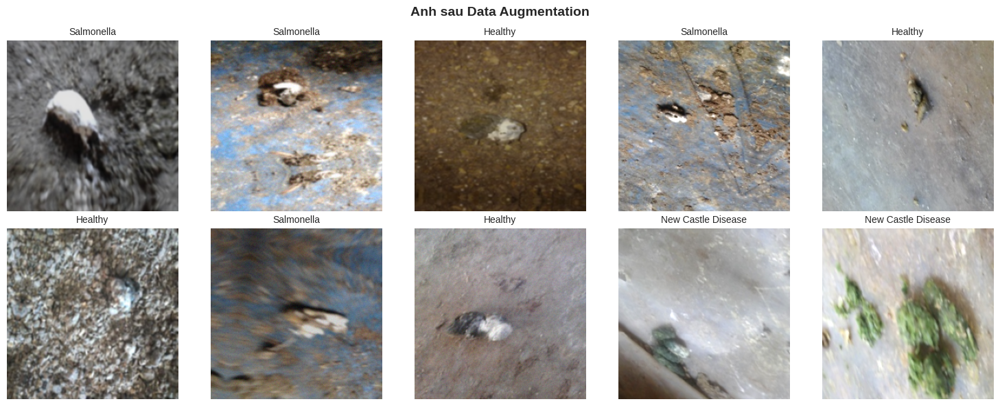

In [ ]:
# Visualize Data Augmentation
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
sample_batch = next(train_generator)
sample_images = sample_batch[0][:10]
sample_labels = sample_batch[1][:10]
for i, (img, label) in enumerate(zip(sample_images, sample_labels)):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(img)
    axes[row, col].axis('off')
    class_idx = np.argmax(label)
    axes[row, col].set_title(idx_to_class[class_idx], fontsize=10)
plt.suptitle('Anh sau Data Augmentation', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()
# Reset generator
train_generator.reset()

Hình ảnh sau tăng cường cho thấy một bộ dữ liệu biến hóa đa dạng với các góc xoay, lật và mức độ sáng tối khác nhau, mô phỏng chính xác điều kiện chụp thực tế trong chuồng trại. Việc áp dụng hiệu ứng mờ nhòe và nhiễu hạt giúp mô hình làm quen với các sai số camera, trong khi kỹ thuật reflect fill đảm bảo tính tự nhiên cho vùng biên ảnh. Kết quả là mô hình sẽ được huấn luyện trên những biến thể phong phú, giúp nâng cao khả năng nhận diện chính xác các bệnh, đặc biệt là với lớp Newcastle vốn có ít mẫu gốc.



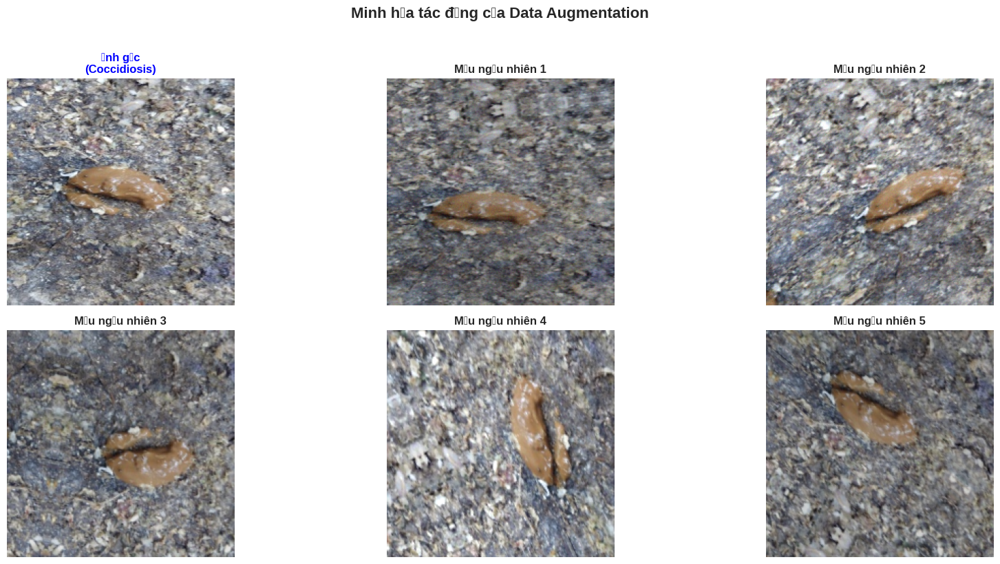

In [ ]:
# So sánh Ảnh gốc và các biến thể sau Data Augmentation
sample_row = train_df_balanced.sample(1).iloc[0]
img_path = sample_row['image_path']
label = sample_row['label']
# Đọc ảnh gốc
original_img = cv2.imread(img_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
original_img = cv2.resize(original_img, (CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE']))
plt.figure(figsize=(18, 8))
# Hiển thị ảnh gốc
plt.subplot(2, 3, 1)
plt.imshow(original_img)
plt.title(f"Ảnh gốc\n({label})", fontsize=12, color='blue', fontweight='bold')
plt.axis('off')
img_array = np.expand_dims(original_img, 0)
aug_iter = train_datagen.flow(img_array, batch_size=1)
# Sử dụng tiêu đề ngẫu nhiên vì ImageDataGenerator áp dụng tổ hợp nhiều phép biến đổi cùng lúc
for i in range(5):
    plt.subplot(2, 3, i + 2)
    # Lấy ảnh đã ImageDataGenerator bao gồm preprocessing_function
    aug_batch = next(aug_iter)
    aug_img = aug_batch[0] # ImageDataGenerator output is normalization [0, 1]
    # Hiển thị ảnh
    plt.imshow(aug_img)
    plt.title(f"Mẫu ngẫu nhiên {i+1}", fontsize=12, fontweight='bold')
    plt.axis('off')
plt.suptitle('Minh họa tác động của Data Augmentation', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()


 Kỹ thuật Data Augmentation đã tạo ra nhiều biến thể ngẫu nhiên khác nhau bằng cách xoay, lật, phóng to và dịch chuyển vị trí.

## Xây dựng CNN from Scratch

Kiến trúc mô hình được thiết kế theo cấu trúc mạng dư (Residual Network) hiện đại, kết hợp giữa hiệu năng mạnh mẽ và khả năng kiểm soát overfitting tối ưu. Cấu trúc mạng gồm ba phần chính: phần Stem sử dụng 3 lớp tích chập liên tiếp để trích xuất tinh xảo các đặc trưng cơ bản; phần Thân mạng gồm 4 cụm khối dư với số lượng bộ lọc tăng dần từ 64 đến 512, cho phép mô hình học được các đặc trưng phức tạp ở nhiều cấp độ khác nhau. Điểm nổi bật là việc sử dụng hàm kích hoạt Swish mượt mà, tích hợp đồng bộ các kỹ thuật điều chuẩn như Batch Normalization, L2 Regularization và hệ thống Dropout đa tầng (từ 0.2 đến 0.5), giúp mạng sâu duy trì sự ổn định và đạt được độ bền bỉ cao khi đối mặt với dữ liệu thực tế. Cuối cùng, lớp Global Average Pooling kết hợp với kiến trúc đầu ra tinh gọn đảm bảo mô hình tập trung tối đa vào việc phân loại chính xác các bệnh lý mà không bị lãng phí tham số.

In [ ]:
from tensorflow.keras import layers, models, regularizers

def residual_block(x, filters, stride=1):
    shortcut = x
    # Layer 1
    x = layers.Conv2D(filters, (3,3), strides=stride, padding='same', 
                      kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('swish')(x)
    # Layer 2
    x = layers.Conv2D(filters, (3,3), padding='same', 
                      kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.BatchNormalization()(x)
    # Shortcut xoay tua neu can
    if stride != 1 or shortcut.shape[-1] != filters:
        shortcut = layers.Conv2D(filters, (1,1), strides=stride, padding='same')(shortcut)
        shortcut = layers.BatchNormalization()(shortcut)
    x = layers.Add()([x, shortcut])
    x = layers.Activation('swish')(x)
    return x
def build_cnn_model(input_shape=(224, 224, 3), num_classes=4):
    inputs = layers.Input(shape=input_shape)
    # --- (3 lớp 3x3) ---
    x = layers.Conv2D(32, (3,3), strides=2, padding='same', kernel_regularizer=regularizers.l2(1e-4))(inputs) 
    x = layers.BatchNormalization()(x)
    x = layers.Activation('swish')(x)
    x = layers.Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(1e-4))(x) 
    x = layers.BatchNormalization()(x)
    x = layers.Activation('swish')(x)
    x = layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(1e-4))(x) 
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((3,3), strides=2, padding='same')(x)
    # --- 4 Block: Sâu & Mượt ---
    # Block 1 (64 filters)
    x = residual_block(x, 64)
    x = residual_block(x, 64)
    x = layers.Dropout(0.2)(x) # Nhẹ nhàng
    # Block 2 (128 filters)
    x = residual_block(x, 128, stride=2)
    x = residual_block(x, 128)
    x = layers.Dropout(0.2)(x) # Vẫn giữ mức 0.2 để bảo toàn thông tin 
    # Block 3 (256 filters)
    x = residual_block(x, 256, stride=2)
    x = residual_block(x, 256)
    x = layers.Dropout(0.3)(x) # Tăng nhẹ lên 0.3
    # Block 4 (512 filters)
    x = residual_block(x, 512, stride=2)
    x = residual_block(x, 512)
    x = layers.Dropout(0.3)(x) # Max 0.3 để không mất feature "xịn"

    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(128, activation='swish', kernel_regularizer=regularizers.l2(1e-4))(x) # Compact 128
    x = layers.Dropout(0.5)(x) 
    outputs = layers.Dense(num_classes, activation='softmax')(x)
    
    return models.Model(inputs, outputs, name="CNN_Pro_Final_Optimized")

Sử dụng thuật toán tối ưu hóa Adam kết hợp với kỹ thuật Gradient Clipping giúp kiểm soát sự bùng nổ đạo hàm, đảm bảo quá trình hội tụ diễn ra ổn định và mượt mà hơn trong suốt các vòng lặp huấn luyện. Mô hình sử dụng hàm mất mát Categorical Crossentropy

In [ ]:
# Xay dung model
input_shape = (CONFIG['IMG_SIZE'], CONFIG['IMG_SIZE'], 3)
model = build_cnn_model(input_shape, CONFIG['NUM_CLASSES'])
# Compile model
# Optimizer voi gradient clipping de on dinh hon
optimizer = Adam(
    learning_rate=CONFIG['LEARNING_RATE'],
    clipnorm=1.0  # Gradient clipping
)
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("\nKien truc CNN Model:")
model.summary()

I0000 00:00:1766021975.169684      24 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0



Kien truc CNN Model:


Model: "CNN_Pro_Final_Optimized"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 112, 112,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 112, 112,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 112, 112,  │      9,248 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 112, 112,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 112, 112,  │     18,496 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 112, 112,  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 56, 56,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 56, 56,    │     36,928 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 56, 56,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 56, 56,    │     36,928 │ activation_2[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        256 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 56, 56,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │ max_pooling2d[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 56, 56,    │          0 │ add[0][0]       

 Total params: 11,276,516 (43.02 MB)

 Trainable params: 11,266,788 (42.98 MB)

 Non-trainable params: 9,728 (38.00 KB)

In [20]:
pip install pydot graphviz

Note: you may need to restart the kernel to use updated packages.


Da luu so do kien truc: model_architecture.png


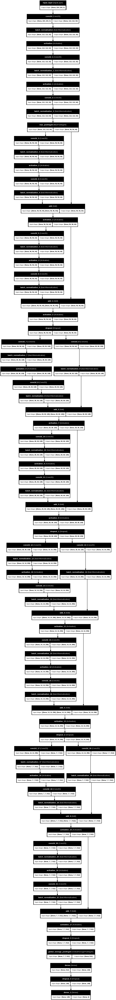

In [21]:
# Visualize kien truc model
import os
from IPython.display import Image as IPImage, display

try:
    tf.keras.utils.plot_model(
        model, 
        to_file='model_architecture.png', 
        show_shapes=True, 
        show_layer_names=True,
        dpi=100
    )
    print("Da luu so do kien truc: model_architecture.png")
    
    if os.path.exists('model_architecture.png'):
        display(IPImage(filename='model_architecture.png'))
except Exception as e:
    print(f"Khong the tao so do model: {e}")
    print("   Can cai dat graphviz va pydot de visualize model")

## Huấn luyện Model

Warmup Scheduler: Giúp mô hình "khởi động" nhẹ nhàng ở những vòng đầu, tránh việc thay đổi trọng số quá đột ngột làm mạng bị sốc.

ReduceLROnPlateau: Khi thấy mô hình học mãi mà không tiến bộ thêm, nó sẽ tự động giảm tốc độ học xuống (giống như đi chậm lại để tìm đường kỹ hơn), giúp mô hình len lỏi vào được những điểm tối ưu nhỏ nhất.

EarlyStopping: Theo dõi sát sao tập kiểm tra; nếu thấy mô hình bắt đầu "học vẹt" (thuộc lòng dữ liệu cũ mà không hiểu bản chất), nó sẽ ra lệnh dừng cuộc chơi ngay lập tức để tiết kiệm thời gian và giữ lại độ chính xác thực tế.

ModelCheckpoint: Luôn túc trực để "chụp ảnh" và lưu lại phiên bản tốt nhất của mô hình. Dù quá trình học có kéo dài bao lâu, bạn vẫn luôn có trong tay file kết quả đạt điểm số cao nhất.

In [ ]:
# Callbacks
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler
# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss', #  Metric để theo dõi
    patience=8,              # Tang patience
    restore_best_weights=True, # Restore weights tốt nhất khi dừng
    verbose=1
)
# Model checkpoint
model_checkpoint = ModelCheckpoint(
    'best_model.keras', 
    monitor='val_accuracy',
    save_best_only=True, # lưu khi có improvement
    mode='max', # cho accuracy
    verbose=1
)
# Reduce LR on plateau
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,              # Giam 50% moi lan
    patience=3,              # Tang patience
    min_lr=1e-7,  #  Learning rate tối thiểu
    verbose=1
)
# Warmup scheduler 
def warmup_scheduler(epoch, lr):
    warmup_epochs = 3
    if epoch < warmup_epochs:
        return lr * ((epoch + 1) / warmup_epochs)
    return lr
warmup_callback = LearningRateScheduler(warmup_scheduler, verbose=1)
callbacks = [warmup_callback, early_stopping, model_checkpoint, reduce_lr]
# Neu muon dung warmup, them: callbacks = [warmup_callback, early_stopping, model_checkpoint, reduce_lr]

Tính toán "nhịp độ" huấn luyện cho mỗi vòng lặp (epoch). Bằng cách chia tổng số lượng ảnh cho kích thước mỗi lô (batch size), xác định được chính xác mô hình cần thực hiện bao nhiêu bước để duyệt hết dữ liệu cân bằng trong tập Train và bao nhiêu bước để kiểm tra trên tập Validation. Việc hiển thị các thông số này giúp bạn kiểm soát chặt chẽ quy mô huấn luyện và ước tính được thời gian hoàn thành trước khi chính thức nhấn nút bắt đầu.

In [ ]:
#  steps per epoch
steps_per_epoch = len(train_df_balanced) // CONFIG['BATCH_SIZE']
validation_steps = len(val_df) // CONFIG['BATCH_SIZE']
print(f"Training configuration:")
print(f"   Steps per epoch: {steps_per_epoch}")
print(f"   Validation steps: {validation_steps}")
print(f"   Total epochs: {CONFIG['EPOCHS']}")

Training configuration:
   Steps per epoch: 229
   Validation steps: 37
   Total epochs: 100


 Lệnh model.fit sẽ kết nối tất cả các thành phần đã chuẩn bị trước đó lại với nhau: nó lấy dữ liệu từ bộ tạo (generator), thực hiện các phép tăng cường để làm giàu tri thức, và lặp lại quá trình này qua nhiều vòng (epochs).

In [ ]:
# Training
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // CONFIG['BATCH_SIZE'],
    epochs=CONFIG['EPOCHS'], 
    validation_data=val_generator,
    validation_steps=val_generator.samples // CONFIG['BATCH_SIZE'],
    callbacks=callbacks,
    verbose=1
)


Epoch 1: LearningRateScheduler setting learning rate to 0.0003333333491658171.
Epoch 1/100


I0000 00:00:1766021997.564481      69 service.cc:152] XLA service 0x7bb720001d90 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1766021997.564523      69 service.cc:160]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1766022000.177973      69 cuda_dnn.cc:529] Loaded cuDNN version 91002


  2/229 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - accuracy: 0.2422 - loss: 2.2658   

I0000 00:00:1766022014.920004      69 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


229/229 ━━━━━━━━━━━━━━━━━━━━ 0s 511ms/step - accuracy: 0.5906 - loss: 1.4047
Epoch 1: val_accuracy improved from -inf to 0.29899, saving model to best_model.keras
229/229 ━━━━━━━━━━━━━━━━━━━━ 154s 539ms/step - accuracy: 0.5910 - loss: 1.4040 - val_accuracy: 0.2990 - val_loss: 2.7584 - learning_rate: 3.3333e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.00022222223924472928.
Epoch 2/100
  1/229 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.7500 - loss: 1.1968
Epoch 2: val_accuracy did not improve from 0.29899
229/229 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7500 - loss: 1.1968 - val_accuracy: 0.2956 - val_loss: 2.8774 - learning_rate: 2.2222e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.00022222223924472928.
Epoch 3/100
229/229 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step - accuracy: 0.7727 - loss: 1.0044
Epoch 3: val_accuracy improved from 0.29899 to 0.65709, saving model to best_model.keras
229/229 ━━━━━━━━━━━━━━━━━━━━ 107s 467ms/step - accuracy: 0.772

In [ ]:

# Luu model
model.save('best_model.keras')

## Đánh giá model và Visualization

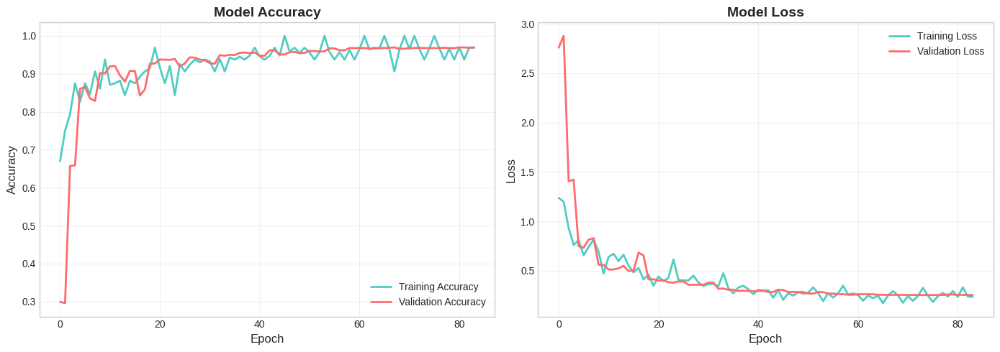

Da luu bieu do: training_curves.png


In [ ]:
# Training History
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
# Plot Accuracy
axes[0].plot(history.history['accuracy'], label='Training Accuracy', linewidth=2, color='#4ECDC4')
axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2, color='#FF6B6B')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Accuracy', fontsize=12)
axes[0].set_title('Model Accuracy', fontsize=14, fontweight='bold')
axes[0].legend(loc='lower right')
axes[0].grid(True, alpha=0.3)
# Plot Loss
axes[1].plot(history.history['loss'], label='Training Loss', linewidth=2, color='#4ECDC4')
axes[1].plot(history.history['val_loss'], label='Validation Loss', linewidth=2, color='#FF6B6B')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Loss', fontsize=12)
axes[1].set_title('Model Loss', fontsize=14, fontweight='bold')
axes[1].legend(loc='upper right')
axes[1].grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

print("Da luu bieu do: training_curves.png")

Mô hình CNN tự xây dựng đạt độ chính xác khoảng 95% trên tập validation sau 80 epochs. Giai đoạn đầu huấn luyện, validation accuracy rất thấp nhưng sau epoch 20 bắt đầu ổn định và hội tụ dần. Loss giảm đều từ 1.2 xuống còn khoảng 0.3-0.4. Có dấu hiệu overfitting nhẹ khi training accuracy cao hơn validation.

In [ ]:
# Load best model
best_model = tf.keras.models.load_model('best_model.keras')
print("Da load best model")
# Danh gia tren validation set
val_generator.reset()
val_loss, val_accuracy = best_model.evaluate(val_generator, verbose=1)
print(f"\nKet qua danh gia tren Validation Set:")
print(f"Loss: {val_loss:.4f}")
print(f"Accuracy: {val_accuracy:.4f} ({val_accuracy*100:.2f}%)")

Da load best model
38/38 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - accuracy: 0.9676 - loss: 0.2630

Ket qua danh gia tren Validation Set:
Loss: 0.2519
Accuracy: 0.9686 (96.86%)


D9ộ chính xác 96.86% với loss 0.2519 trên tập validation. Đây là kết quả tốt cho một mô hình được xây dựng từ đầu 

In [ ]:
# Du doan tren validation set
val_generator.reset()
predictions = best_model.predict(val_generator, verbose=1)
predicted_classes = np.argmax(predictions, axis=1)
# Lay true labels
true_classes = val_generator.classes
class_labels = list(val_generator.class_indices.keys())

print(f"\nSo mau du doan: {len(predicted_classes)}")
print(f"So mau thuc te: {len(true_classes)}")

38/38 ━━━━━━━━━━━━━━━━━━━━ 6s 108ms/step

So mau du doan: 1210
So mau thuc te: 1210


In [29]:
# Classification Report
print("\n" + "="*60)
print("CLASSIFICATION REPORT")
print("="*60)
print(classification_report(true_classes, predicted_classes, target_names=class_labels))


CLASSIFICATION REPORT
                    precision    recall  f1-score   support

       Coccidiosis       0.99      0.96      0.98       371
           Healthy       0.96      0.95      0.95       360
New Castle Disease       0.96      0.96      0.96        85
        Salmonella       0.96      0.99      0.97       394

          accuracy                           0.97      1210
         macro avg       0.97      0.97      0.97      1210
      weighted avg       0.97      0.97      0.97      1210



Do chính xác tổng thể 97% với các chỉ số precision, recall và f1-score cân bằng giữa các lớp (0.95-0.99). Lớp Coccidiosis có precision cao nhất (0.99), trong khi Salmonella có recall cao nhất (0.99). Lớp Healthy có hiệu suất thấp nhất nhưng vẫn đạt f1-score 0.95. Lớp New Castle Disease dù ít mẫu nhất vẫn đạt kết quả ổn định (f1-score 0.96). Macro average và weighted average đều bằng 0.97, cho thấy mô hình phân loại tốt trên tất cả các lớp bệnh.

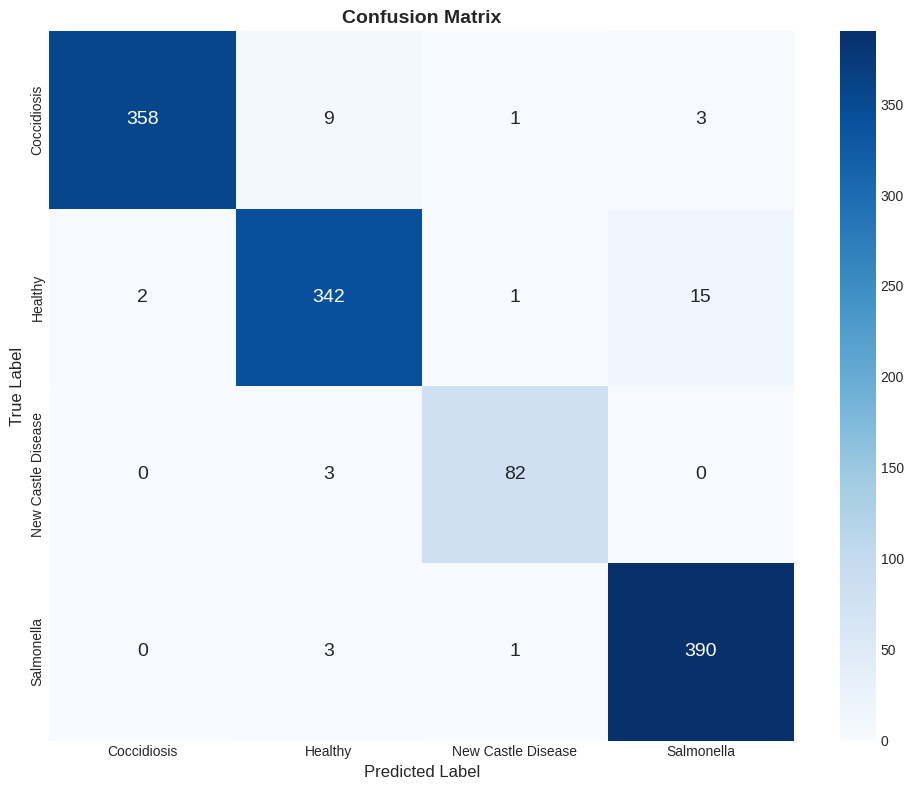

Da luu: confusion_matrix.png


In [30]:
# Confusion Matrix
cm = confusion_matrix(true_classes, predicted_classes)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_labels, yticklabels=class_labels,
            annot_kws={'size': 14})
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.title('Confusion Matrix', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

print("Da luu: confusion_matrix.png")

Tổng 38/1210 mẫu bị sai. Lỗi phổ biến nhất là lớp Healthy bị nhầm thành Salmonella (15 mẫu) và Coccidiosis bị nhầm thành Healthy (9 mẫu). Lớp Salmonella có tỷ lệ đúng cao nhất (390/394) trong khi Healthy có nhiều lỗi nhất (18 mẫu sai). 


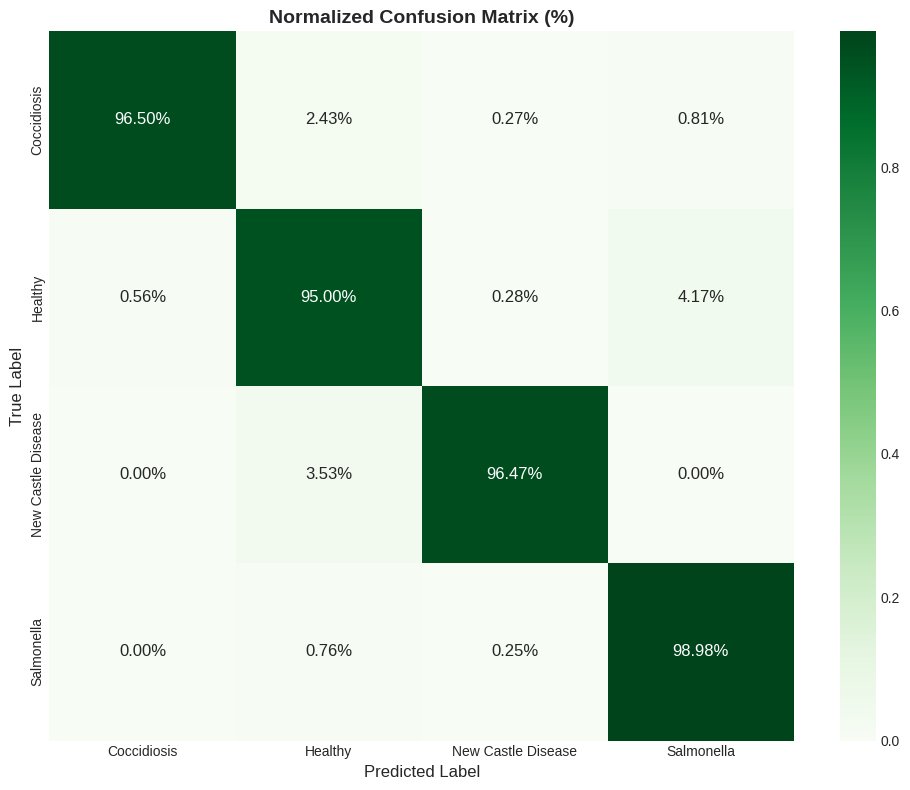

Da luu: confusion_matrix_normalized.png


In [31]:
# Normalized Confusion Matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Greens', 
            xticklabels=class_labels, yticklabels=class_labels,
            annot_kws={'size': 12})
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.title('Normalized Confusion Matrix (%)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('confusion_matrix_normalized.png', dpi=150, bbox_inches='tight')
plt.show()

print("Da luu: confusion_matrix_normalized.png")

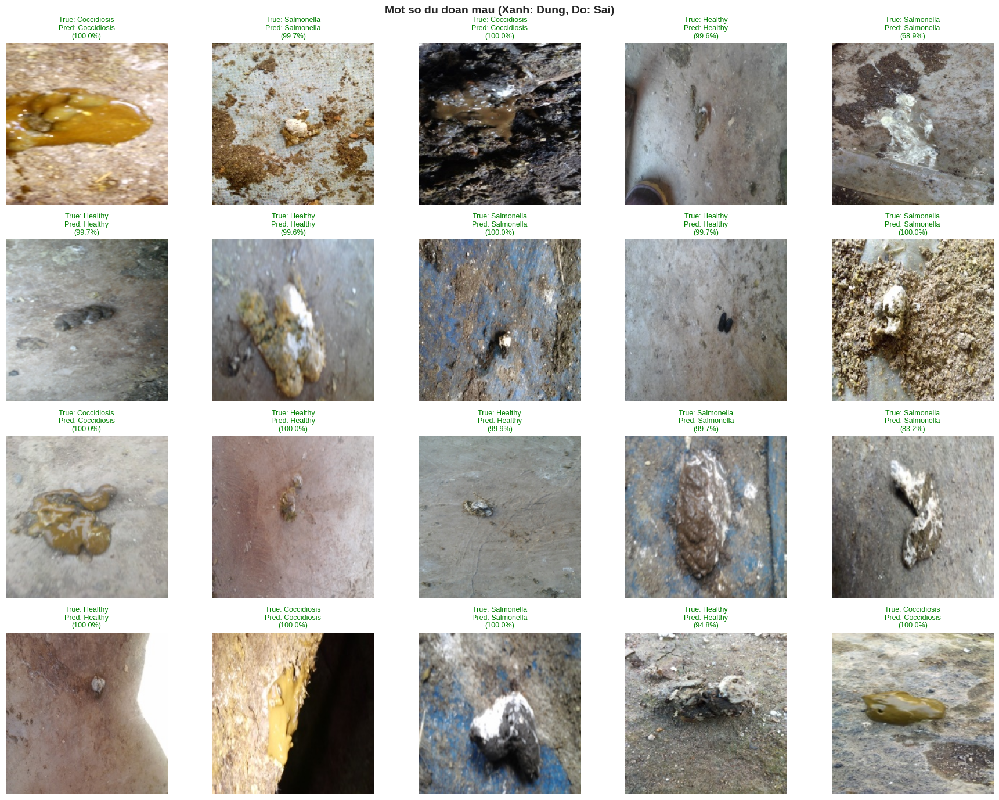

Da luu: sample_predictions.png


In [32]:
# Hien thi mot so du doan mau
fig, axes = plt.subplots(4, 5, figsize=(18, 14))

# Reset generator va lay batch
val_generator.reset()
sample_batch = next(val_generator)
sample_images = sample_batch[0][:20]
sample_true_labels = np.argmax(sample_batch[1][:20], axis=1)

# Du doan
sample_predictions = best_model.predict(sample_images, verbose=0)
sample_pred_labels = np.argmax(sample_predictions, axis=1)
sample_confidences = np.max(sample_predictions, axis=1)

for i in range(20):
    row = i // 5
    col = i % 5
    
    axes[row, col].imshow(sample_images[i])
    axes[row, col].axis('off')
    
    true_label = class_labels[sample_true_labels[i]]
    pred_label = class_labels[sample_pred_labels[i]]
    confidence = sample_confidences[i] * 100
    
    # Mau xanh neu dung, do neu sai
    color = 'green' if sample_true_labels[i] == sample_pred_labels[i] else 'red'
    
    title = f"True: {true_label}\nPred: {pred_label}\n({confidence:.1f}%)"
    axes[row, col].set_title(title, fontsize=9, color=color)

plt.suptitle('Mot so du doan mau (Xanh: Dung, Do: Sai)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('sample_predictions.png', dpi=150, bbox_inches='tight')
plt.show()

print("Da luu: sample_predictions.png")

[*] Đang thực hiện dự đoán trên tập dữ liệu (1210 mẫu)...
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

[+] KẾT QUẢ PHÂN TÍCH:
 - Tổng số ảnh kiểm tra: 1210
 - Số lượng ảnh sai: 38
 - Độ chính xác thực tế: 96.86%
 - Danh sách chi tiết đã lưu vào: 'misclassified_analysis.csv'


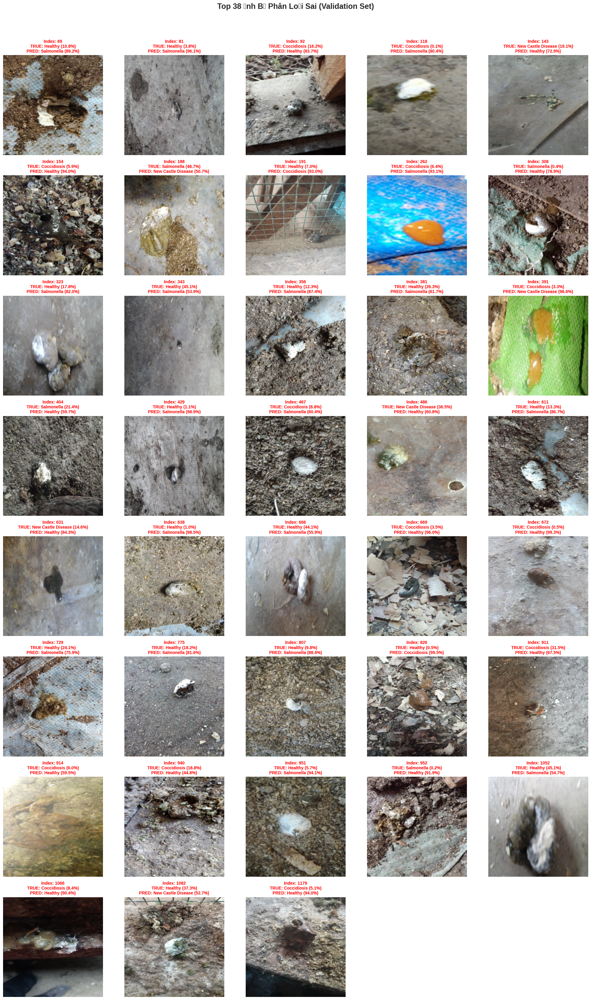

In [ ]:
from tensorflow.keras.preprocessing.image import load_img

def analyze_misclassified(model, generator, num_images=30):
    print(f"[*] Đang thực hiện dự đoán trên tập dữ liệu ({len(generator.classes)} mẫu)...")
    generator.reset()
    #  Dự đoán và lấy xác suất
    preds = model.predict(generator, verbose=1)
    pred_classes = np.argmax(preds, axis=1)
    true_classes = generator.classes
    class_labels = list(generator.class_indices.keys())
    # Xác định các chỉ số bị sai
    errors = np.where(pred_classes != true_classes)[0]
    total_samples = len(true_classes)
    accuracy = (total_samples - len(errors)) / total_samples
    print(f"\n[+] KẾT QUẢ PHÂN TÍCH:")
    print(f" - Tổng số ảnh kiểm tra: {total_samples}")
    print(f" - Số lượng ảnh sai: {len(errors)}")
    print(f" - Độ chính xác thực tế: {accuracy:.2%}")
    if len(errors) == 0:
        print("[!] Tuyệt vời! Không có ảnh nào bị phân loại sai.")
        return [], errors, preds

    #  Tạo DataFrame quản lý thông tin lỗi
    error_details = []
    for idx in errors:
        true_label = class_labels[true_classes[idx]]
        pred_label = class_labels[pred_classes[idx]]
        true_prob = preds[idx][true_classes[idx]] * 100
        pred_prob = preds[idx][pred_classes[idx]] * 100
        
        error_details.append({
            'index': idx,
            'filename': os.path.basename(generator.filepaths[idx]),
            'path': generator.filepaths[idx],
            'true_label': true_label,
            'pred_label': pred_label,
            'true_conf': true_prob,
            'pred_conf': pred_prob
        })
    
    df_errors = pd.DataFrame(error_details)
    df_errors.to_csv('misclassified_analysis.csv', index=False)
    print(f" - Danh sách chi tiết đã lưu vào: 'misclassified_analysis.csv'")

    # optimized grid
    to_show = min(len(errors), num_images)
    cols = 5
    rows = (to_show + cols - 1) // cols
    
    plt.figure(figsize=(20, 4 * rows))
    for i in range(to_show):
        err = error_details[i]
        try:
            img = load_img(err['path'], target_size=(224, 224))
            plt.subplot(rows, cols, i + 1)
            plt.imshow(img)
            title = (f"Index: {err['index']}\n"
                     f"TRUE: {err['true_label']} ({err['true_conf']:.1f}%)\n"
                     f"PRED: {err['pred_label']} ({err['pred_conf']:.1f}%)")
            plt.title(title, color='red', fontsize=10, fontweight='bold')
            plt.axis('off')
        except Exception as e:
            print(f"[!] Lỗi hiển thị ảnh {err['filename']}: {e}")
            
    plt.suptitle(f"Top {to_show} Ảnh Bị Phân Loại Sai (Validation Set)", fontsize=18, y=1.02, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return df_errors, errors, preds

# Thực thi phân tích
df_mis, err_idx, raw_preds = analyze_misclassified(best_model, val_generator, num_images=40)



Evaluating on Test Set...
38/38 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - accuracy: 0.9665 - loss: 0.2481
Test Loss: 0.2558894753456116
Test Accuracy: 0.967795193195343
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step

Test Set Classification Report:
                    precision    recall  f1-score   support

       Coccidiosis       0.98      0.97      0.98       372
           Healthy       0.96      0.95      0.95       361
New Castle Disease       0.93      1.00      0.97        84
        Salmonella       0.97      0.97      0.97       394

          accuracy                           0.97      1211
         macro avg       0.96      0.97      0.97      1211
      weighted avg       0.97      0.97      0.97      1211



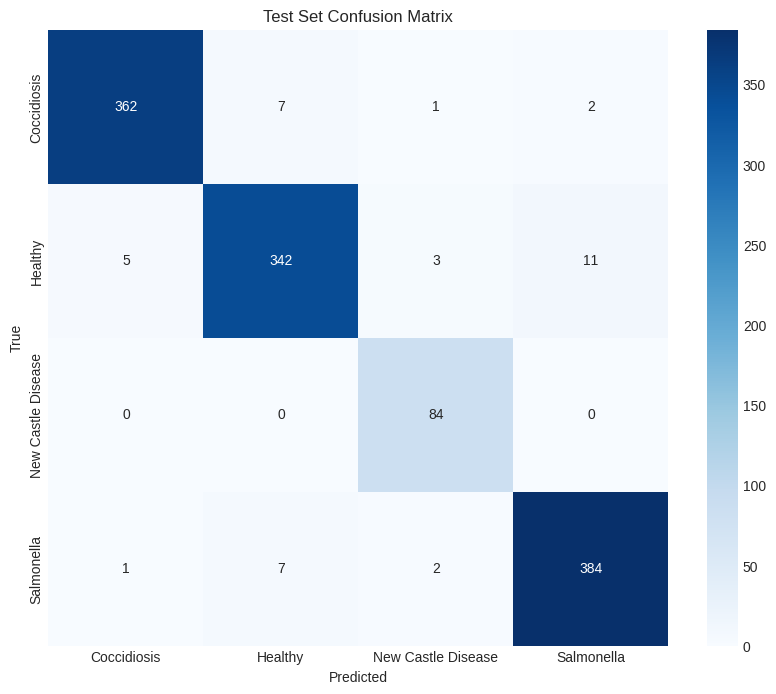

In [34]:

# Evaluate on TEST Set
print("\nEvaluating on Test Set...")
test_loss, test_accuracy = best_model.evaluate(test_generator, verbose=1)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

# Confusion Matrix for Test Set
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Predictions
test_generator.reset()
predictions = best_model.predict(test_generator, verbose=1)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Classification Report
print("\nTest Set Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Confusion Matrix Heatmap
cm = confusion_matrix(true_classes, predicted_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Test Set Confusion Matrix')
plt.show()


độ chính xác 96.78% với loss 0.2559 trên tập test, gần tương đương validation 96.86%, cho thấy khả năng tổng quát hóa tốt. Điểm nổi bật là lớp New Castle Disease đạt recall hoàn hảo 100%, nghĩa là mô hình không bỏ sót bất kỳ mẫu nào của bệnh này. Lớp Healthy vẫn có nhiều lỗi nhất với 19 mẫu bị nhầm sang các lớp khác, đặc biệt là Salmonell. Tổng cộng 39/1211 mẫu bị phân loại sai , kết quả tương đương tập validation. Nhìn chung, mô hình CNN tự xây dựng hoạt động ổn định và đáng tin cậy trên cả hai tập đánh giá.